# [E16] 프로젝트-SRGAN

## 프로젝트 1 : 직접 고른 이미지로 SRGAN 실험하기

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
import PIL.Image as pilimg
import tensorflow as tf
import os

from skimage import data
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

In [2]:
model_file = os.getenv('HOME')+'/aiffel/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

In [3]:
def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

In [4]:
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

## 프로젝트 1-1.

#### 1. (적당히) 높은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.

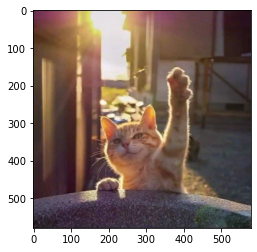

In [5]:
img_path = os.getenv('HOME')+'/aiffel/super_resolution/image.jpg'
image = pilimg.open(img_path)
hr = np.array(image)
plt.imshow(hr)

In [6]:
hr.shape

(579, 579, 3)

In [7]:
hr = cv2.resize(hr, (500, 500))

#### 2. 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 1/4로 줄입니다. cv2.resize()를 사용해 봅시다.

In [8]:
lr = cv2.resize(
    hr, 
    dsize=(int(hr.shape[1]/4), int(hr.shape[0]/4)),
    interpolation=cv2.INTER_LINEAR
)

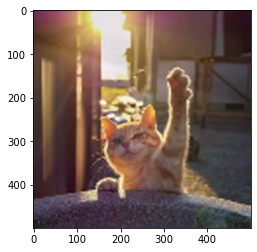

In [9]:
bicubic_hr = cv2.resize(
    lr, 
    dsize=(hr.shape[1], hr.shape[0]),
    interpolation=cv2.INTER_CUBIC
)
plt.imshow(bicubic_hr)

#### 3. 줄인 저해상도 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.

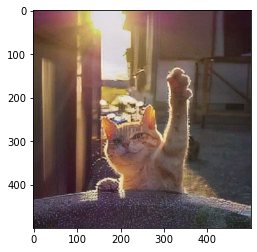

In [10]:
srgan_hr = apply_srgan(lr)
plt.imshow(srgan_hr)

#### 4. 2의 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. 마찬가지로 cv2.resize()를 사용해 봅시다.

In [11]:
img = [bicubic_hr, srgan_hr, hr]

/home/aiffel-dj42/anaconda3/envs/aiffel/lib/python3.7/site-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


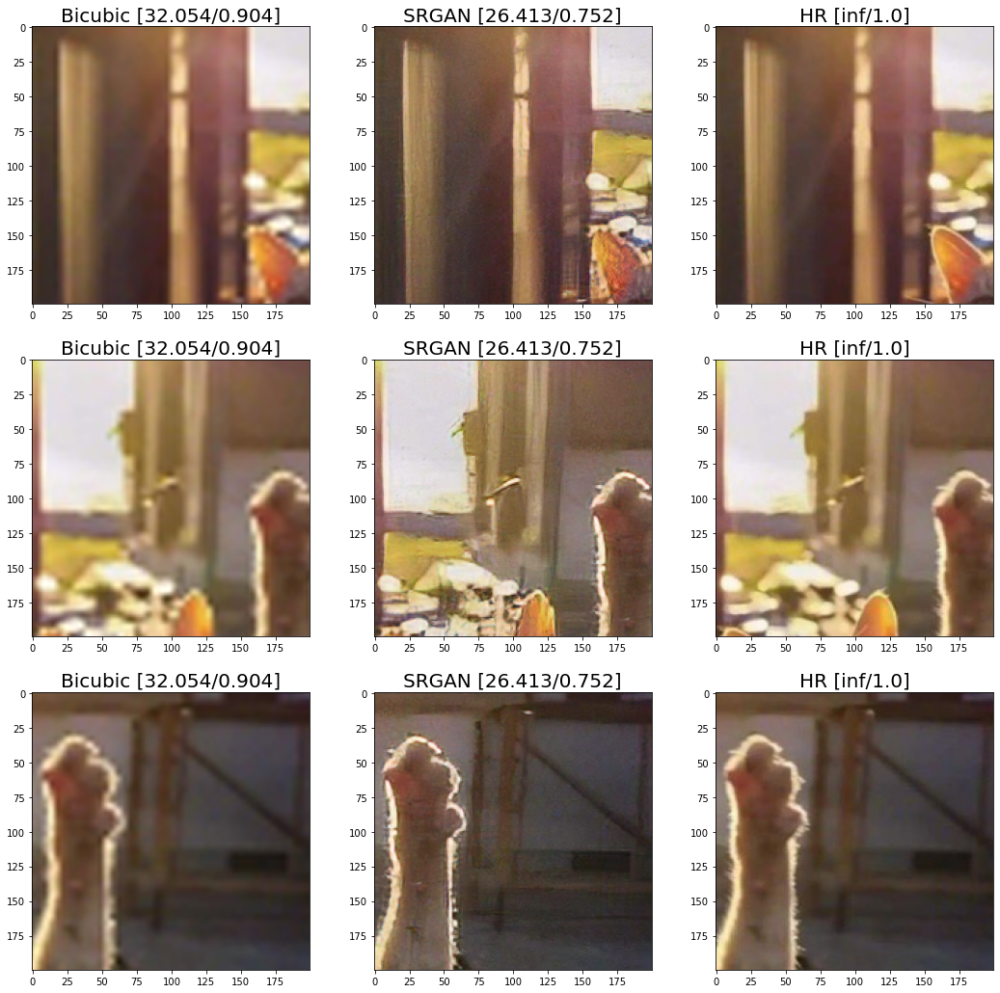

In [12]:
left_top = [(100, 0), (50,150), (100, 300)]

images = []
for i in range(len(left_top)):
    img1 = crop(bicubic_hr, left_top[i], 200, 200)
    img2 = crop(srgan_hr , left_top[i], 200, 200)
    img3 = crop(hr, left_top[i], 200, 200)
    images.extend([img1, img2, img3])
labels = ["Bicubic", "SRGAN", "HR"]*3

psnr = [round(peak_signal_noise_ratio(hr, i), 3) for i in img]*3
ssim = [round(structural_similarity(hr, i, multichannel=True), 3) for i in img]*3

plt.figure(figsize=(18,18))
for i in range(len(images)):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i]+ f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

#### 5. 3개 이미지(4.의 Bicubic의 결과, 3.의 SRGAN의 결과, 1.의 원래 고해상도 이미지)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.

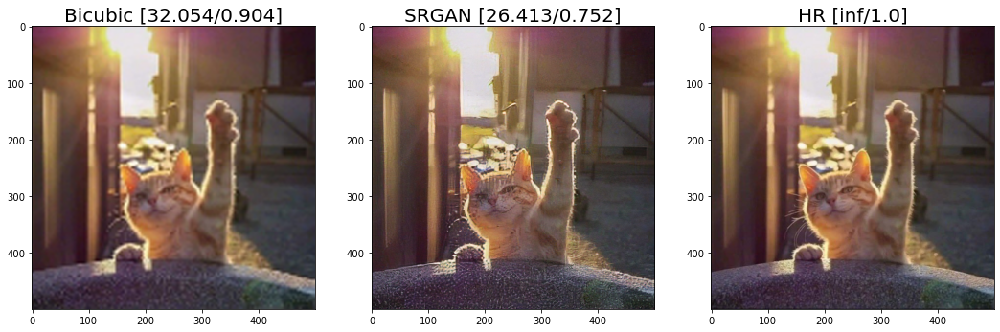

In [13]:
plt.figure(figsize=(18,18))
for i in range(len(img)):
    plt.subplot(1,3,i+1) 
    plt.imshow(img[i])
    plt.title(labels[i]+ f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

#### 6. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)  
srgan과 hr 모두 선명하게 보정됐지만, srgan은 화질이 거칠고 울퉁불퉁한 느낌인 반면, hr은 비교적 부드러우면서도 선명하게 출력됨

## 프로젝트 1-2.

#### 1. (적당히) 낮은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.

(451, 622, 3)

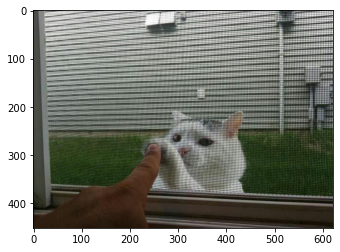

In [14]:
img_path = os.getenv('HOME')+'/aiffel/super_resolution/test.jpg'
image = pilimg.open(img_path)
hr = np.array(image)
plt.imshow(hr)

hr.shape

#### 2. 불러온 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.

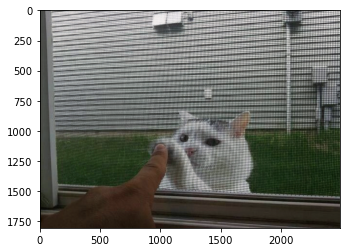

In [15]:
srgan_hr = apply_srgan(hr)
plt.imshow(srgan_hr)

#### 3. 1.에서 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. cv2.resize()를 사용해 봅시다.

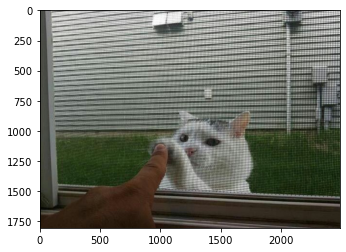

In [16]:
bicubic_hr = cv2.resize(
    hr, 
    dsize=(hr.shape[1]*4, hr.shape[0]*4), # 고해상도 이미지 크기로 설정
    interpolation=cv2.INTER_CUBIC
)
plt.imshow(bicubic_hr)

In [17]:
img = [bicubic_hr, srgan_hr]

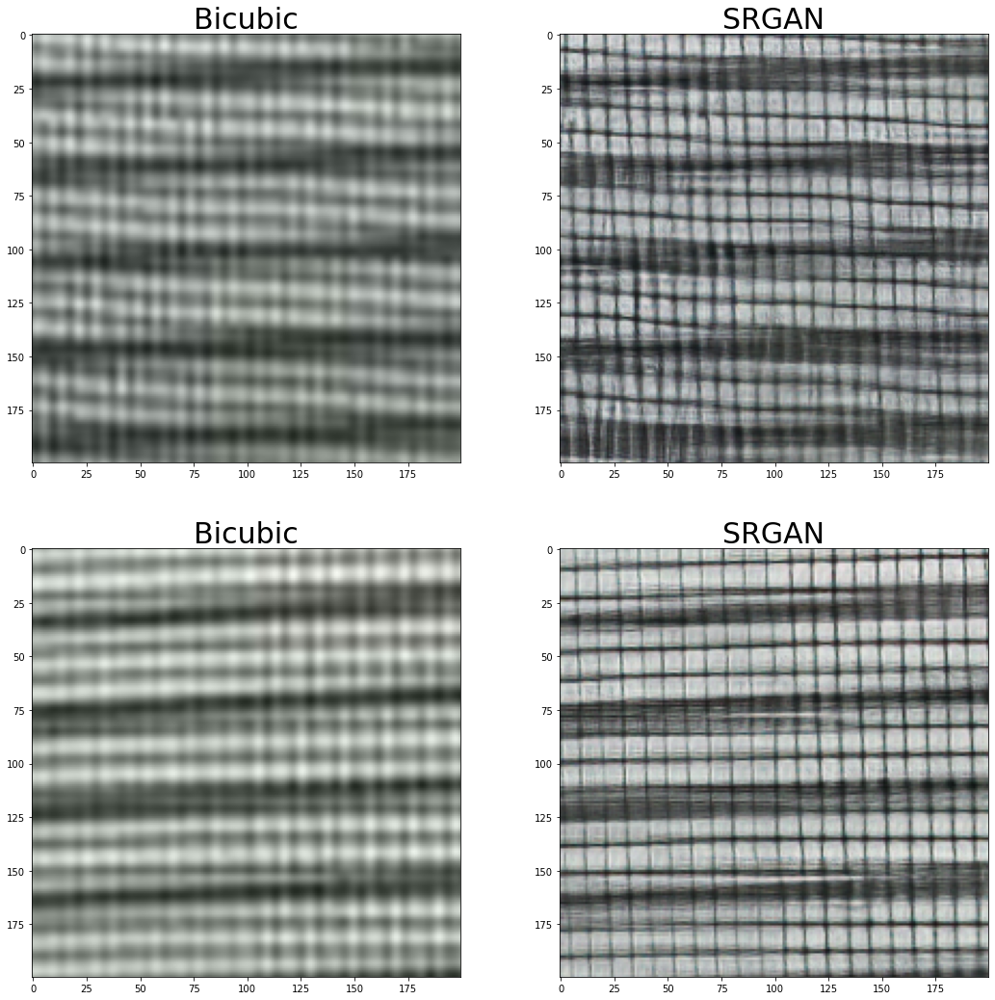

In [18]:
left_top = [(600,300), (400, 600)]

images = []
for i in range(len(left_top)):
    img1 = crop(bicubic_hr, left_top[i], 200, 200)
    img2 = crop(srgan_hr , left_top[i], 200, 200)
    images.extend([img1, img2])
labels = ["Bicubic", "SRGAN"]*2

plt.figure(figsize=(18,18))
for i in range(len(images)):
    plt.subplot(2,2,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

#### 4. 2개 이미지(3.의 Bicubic의 결과, 2.의 SRGAN의 결과)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.

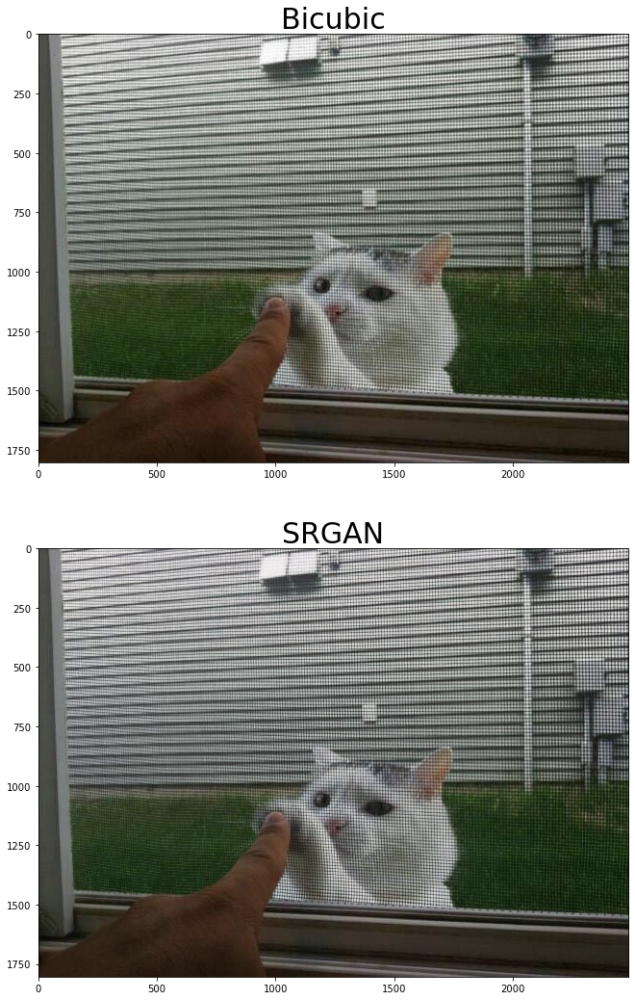

In [19]:
plt.figure(figsize=(18,18))
for i in range(len(img)):
    plt.subplot(2,1,i+1) 
    plt.imshow(img[i])
    plt.title(labels[i], fontsize=30)

#### 5. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)  
전체적인 이미지로 확인하면 큰 변화가 안 보이지만 3번에서 crop한 bicubic 이미지를 보면 흐릿하고 뿌옇게 보이는 철망이 비교적 선명하게 복원된다.

# 프로젝트 2 : SRGAN을 이용해 고해상도 gif 생성하기  
  
이전 Super Resolution의 활용 사례에 대해 살펴봤을 때, 단일 이미지가 아닌 영상에 대해 Super Resolution을 적용한 사례가 있었습니다. 이번에는 이미 학습된 SRGAN을 이용해 저해상도 영상을 고해상도 영상으로 바꿔보는 프로젝트를 수행해 봅시다.  
  
실제로 동영상의 Super Resolution은 시간 순서에 따른 다수의 프레임 정보를 고려하는 것이 더 좋지만, 처음부터 학습시키기에 많은 시간이 소요됩니다. 여기서는 이전에 사용했던 SRGAN을 이용해 한 프레임씩 고해상도 이미지로 변환 시켜 모든 프레임에 대해 적용하고, 그 프레임들을 합쳐 동영상으로 만들어 봅시다.  
  
각 프레임들을 모아 gif 파일을 만드는데 아래 라이브러리의 설치가 필요합니다.  
```
$ pip install imageio
```

#### 1. gif 파일 불러오기

In [20]:
gif_path = os.getenv('HOME')+'/aiffel/super_resolution/gif/'

In [21]:
import cv2

#다운 받은 파일의 경로를 설정해 주세요.
gif = cv2.VideoCapture(gif_path + 'cat.gif')

isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수 : 92
frame 크기 : (286, 288, 3)


#### 2. 프레임별 Super Resolution 진행하기

In [22]:
frames_bicubic = []
frames_srgan = []
frames_sr = []

for i in range(len(frames)):
    frame_bicubic = cv2.resize(
        frames[i], 
        dsize=(frames[0].shape[1]*4, frames[0].shape[0]*4),
        interpolation=cv2.INTER_CUBIC
    )
    frames_bicubic.append(frame_bicubic)
    
    frame_srgan = apply_srgan(frames[i])
    frames_srgan.append(frame_srgan)

frames_sr = [frames_bicubic, frames_srgan]

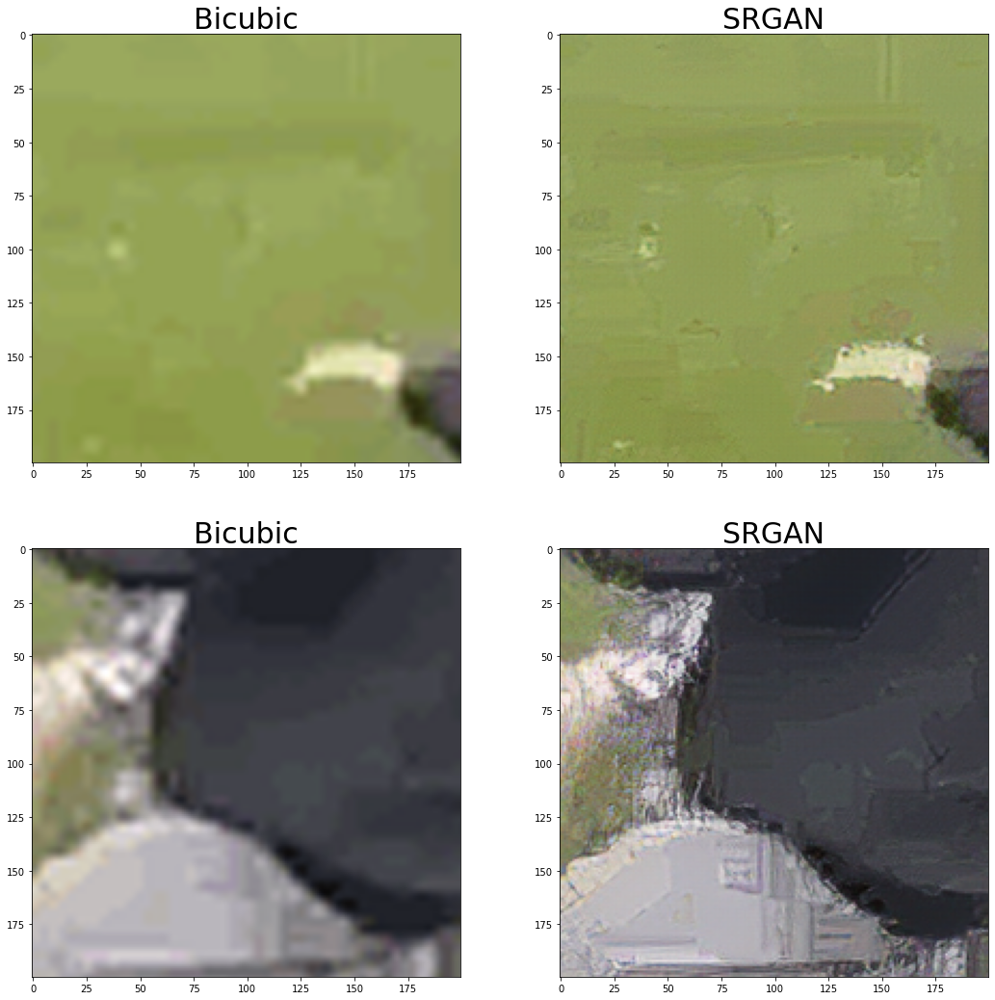

In [23]:
#결과가 잘 나왔는 지 확인하기
left_top = [(200,400), (400,600)]

images = []
for i in range(len(left_top)):
    img1 = crop(frames_sr[0][0], left_top[i], 200, 200)
    img2 = crop(frames_sr[1][0],  left_top[i], 200, 200)
    images.extend([img1, img2])
labels = ["Bicubic", "SRGAN"]*2

plt.figure(figsize=(18,18))
for i in range(len(images)):
    plt.subplot(2,2,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

#### 3. 프레임을 합쳐 gif 만들기

In [24]:
import imageio

imageio.mimsave(gif_path + "cat_bicubic.gif", frames_sr[0])
imageio.mimsave(gif_path + "cat_srgan.gif", frames_sr[1])

#### 4. Jupyter notebook에 gif 표시하기

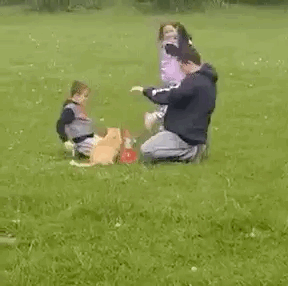

In [25]:
from IPython.display import Image as show_gif

show_gif(filename=(gif_path + "cat.gif"), width=500)

show_gif(gif_path + "cat_bicubic.gif", width=500)

show_gif(gif_path + "cat_srgan.gif", width=500)

오히려 가운데 물체와 고양이가 좀 더 투명해지고 화질이 더 안좋아진 느낌

## 회고  
이번 과제는 특히 해야 할 것도 많고 더 복잡한 느낌이어서 하는 내내 마음이 너무 불편하고 쫓기는 느낌이었는데, 좀 더 차분하게 마음을 가다듬고 다시 해보고 싶다. 조만간 아무도 없는 곳에서 혼자 고독하게 코드를 짜볼 것이다...